# Bilateral Filtering

In [1]:
# Importing relevant packages and doing necessary setup
import cv2
import matplotlib.pyplot as plt
import matplotlib
import PIL
import numpy as np

%matplotlib inline

# for auto-reloading external modules
%load_ext autoreload
%autoreload 2

In [2]:
# Helper function to display multiple images in a plot
def display_images(images, rows, cols, size, title, subtitles):
    fig = plt.figure(figsize = size)
    c = 0
    sz = len(images)
    for i in range(rows):
        for j in range(cols):
            if sz == c:
                break
            ax1 = fig.add_subplot(rows, cols, c + 1)
            ax1.imshow(images[c], cmap = 'gray')
            ax1.set_title(subtitles[c], fontsize = 16)
            c = c + 1
    plt.show()
    # Un comment the below line and comment the above line to save and display
    #plt.savefig('part2.png')

### Part 1

In [3]:
def bilateral_filter(img, sigma_d, sigma_r, sz):
    gaussian_kernel = np.zeros((sz, sz))
    res = np.zeros(img.shape)
    img = img.astype(np.float64)
    rows = img.shape[0]
    cols = img.shape[1]
    for i in range(sz):
        for j in range(sz):
                gaussian_kernel[i][j] = np.exp(-(((i - int(sz / 2)) * (i - int(sz / 2))) + ((j - int(sz / 2)) * (j - int(sz / 2))) ) / (2 * sigma_d * sigma_d))
    for i in range(int(sz / 2), rows - int(sz / 2)):
        for j in range(int(sz / 2), cols - int(sz / 2)):
            for k in range(3):
                l_r = i - int(sz / 2)
                r_r = i + int(sz / 2)
                l_c = j - int(sz / 2)
                r_c = j + int(sz / 2)
                subpart = img[l_r : r_r + 1, l_c : r_c + 1, k : k + 1].reshape(sz, -1)
                second_component = img[l_r : r_r + 1, l_c : r_c + 1, k : k + 1].reshape(sz, -1) - img[i][j][k]
                range_component = second_component * second_component
                range_component = range_component / (2 * sigma_r * sigma_r)
                range_component = np.exp(-range_component)
                kernel = gaussian_kernel * range_component
                s = sum(sum(kernel))
                res[i][j][k] = (sum(sum(subpart * kernel))) / s
    return res.astype('uint8')

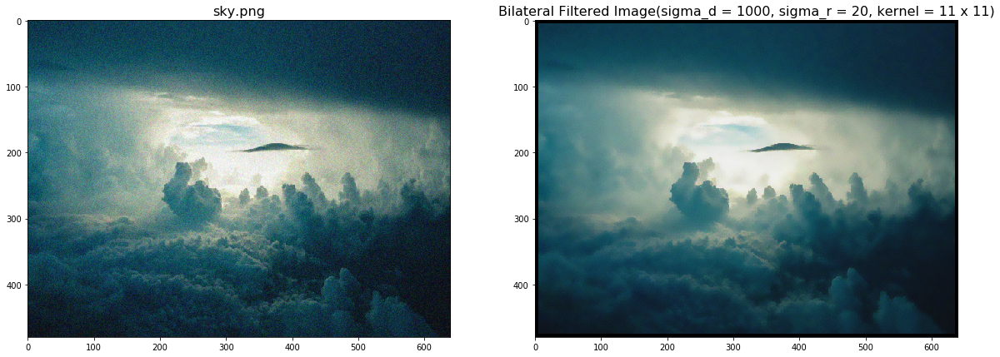

In [4]:
images = []
subtitles = []
img = cv2.cvtColor(cv2.imread('../input_data/sky.png'), cv2.COLOR_BGR2RGB)
output = bilateral_filter(img, 1000, 20, 11)
images.append(img)
images.append(output)
subtitles.append('sky.png')
subtitles.append('Bilateral Filtered Image(sigma_d = 1000, sigma_r = 20, kernel = 11 x 11)')
display_images(images, 1, 2, (20, 20), 'title', subtitles)

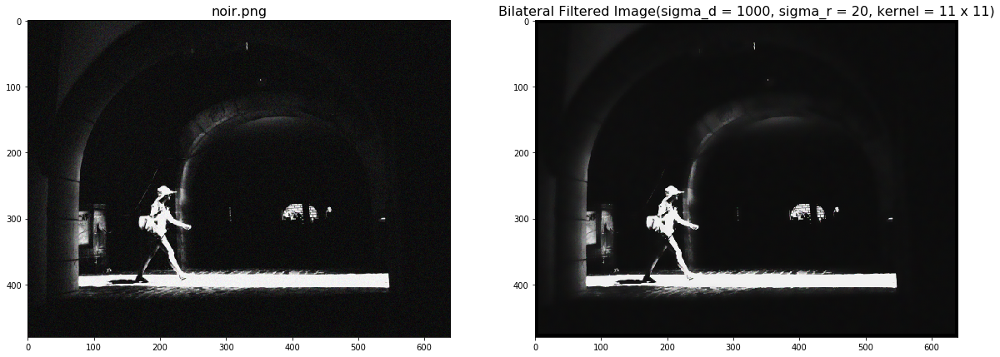

In [5]:
images = []
subtitles = []
img = cv2.cvtColor(cv2.imread('../input_data/noir.png'), cv2.COLOR_BGR2RGB)
output = bilateral_filter(img, 1000, 20, 11)
images.append(img)
images.append(output)
subtitles.append('noir.png')
subtitles.append('Bilateral Filtered Image(sigma_d = 1000, sigma_r = 20, kernel = 11 x 11)')
display_images(images, 1, 2, (20, 20), 'title', subtitles)

### Part 2

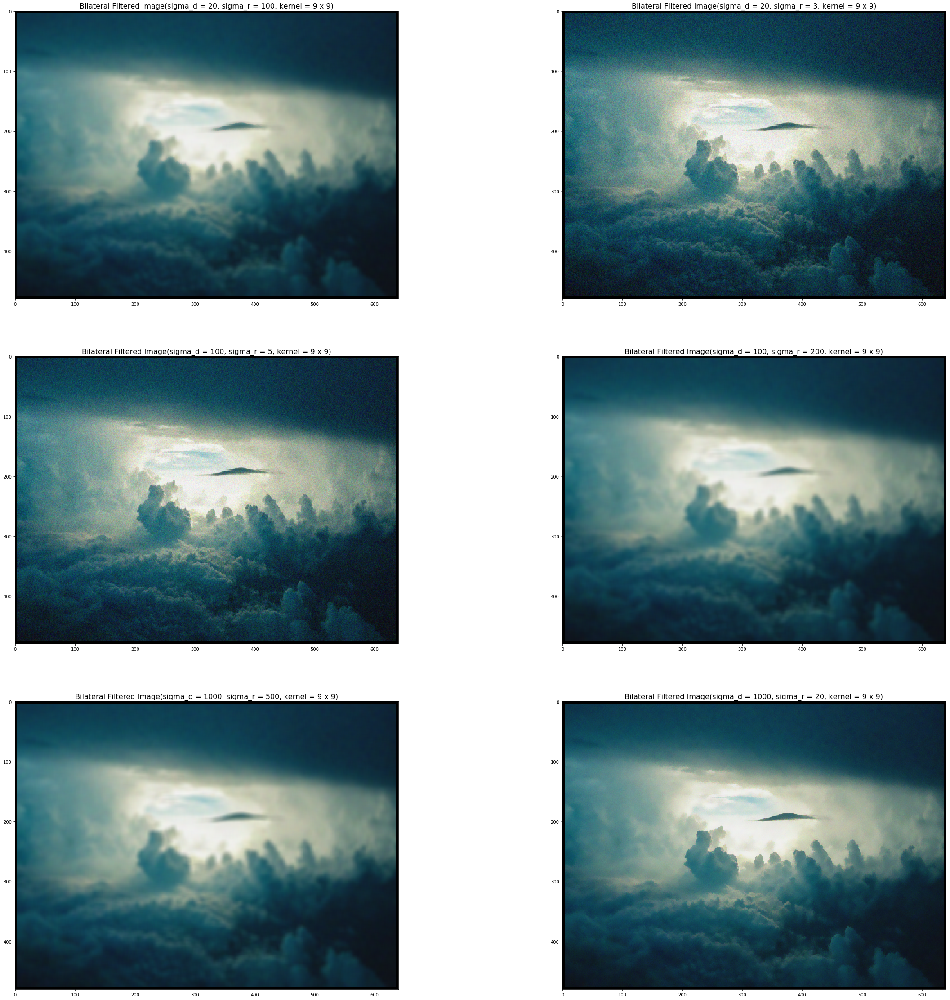

In [6]:
gt = cv2.cvtColor(cv2.imread('../input_data/gt_sky.png'), cv2.COLOR_BGR2RGB)
s1 = [20, 20, 100, 100, 1000, 1000]
s2 = [100, 3, 5, 200, 500, 20]
diff = []
images = []
subtitles = []
img = cv2.cvtColor(cv2.imread('../input_data/sky.png'), cv2.COLOR_BGR2RGB)
for i in range(len(s1)):
    output = bilateral_filter(img, s1[i], s2[i], 9)
    images.append(output)
    subtitles.append('Bilateral Filtered Image(sigma_d = ' + str(s1[i]) + ', sigma_r = ' + str(s2[i]) + ', kernel = 9 x 9)')
display_images(images, 3, 2, (40, 40), 'title', subtitles)

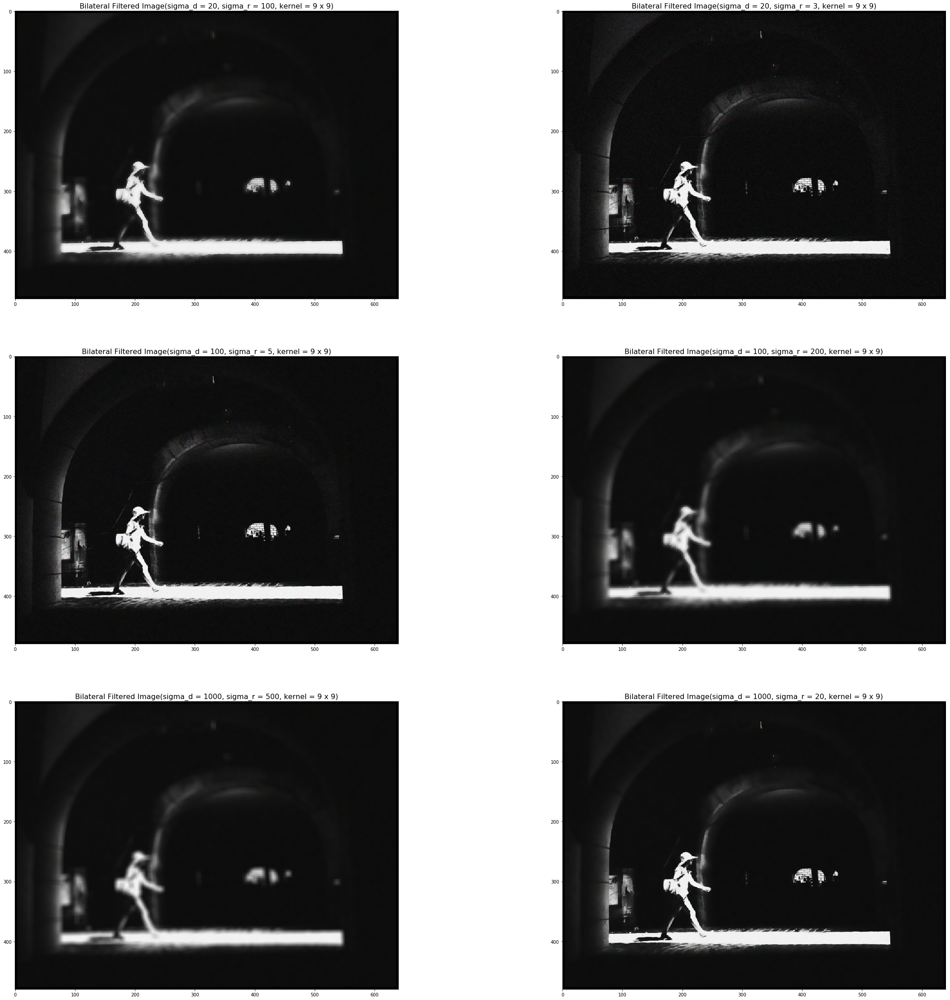

In [7]:
gt = cv2.cvtColor(cv2.imread('../input_data/gt_noir.png'), cv2.COLOR_BGR2RGB)
s1 = [20, 20, 100, 100, 1000, 1000]
s2 = [100, 3, 5, 200, 500, 20]
diff = []
images = []
subtitles = []
img = cv2.cvtColor(cv2.imread('../input_data/noir.png'), cv2.COLOR_BGR2RGB)
for i in range(len(s1)):
    output = bilateral_filter(img, s1[i], s2[i], 9)
    images.append(output)
    subtitles.append('Bilateral Filtered Image(sigma_d = ' + str(s1[i]) + ', sigma_r = ' + str(s2[i]) + ', kernel = 9 x 9)')
display_images(images, 3, 2, (40, 40), 'title', subtitles)

When sigma_d is 1000 and sigma_r is 20 and kernel size is 11, we minimize L-2 distance between ground truth image and bilaterally filtered original image